In [1]:
import matplotlib.pylab as plt
%matplotlib inline
from wordcloud import WordCloud
import nltk
from konlpy.corpus import kolaw
from konlpy.tag import *
import pandas as pd
import platform
from collections import Counter
from matplotlib import font_manager, rc
from konlpy.tag import Twitter; t = Twitter()
import numpy as np
from PIL import Image
from wordcloud import ImageColorGenerator

In [2]:
import colorsys
import random
import platform

In [3]:
df = pd.read_csv("../petition_data_all.csv")

## 월별 워드클라우드 진행을 위해 월별로 바꾸기ㅡ

In [4]:
def find_day(count):
    return count[:-3]

In [5]:
df["start-days"] = df["start-days"].map(find_day)
df

,num,category,start-days,end-days,person,progress,title,count,petition_overview
0,21,안전/환경,2017-08,2017-11-17,kakao - ***,청원종료,스텔라 데이지호에 대한 제안입니다.,9,\n\t\t\t\t\t\t\t\t\t\t\t스텔라 데이지호에 대한 제안입니다. \n...
1,22,기타,2017-08,2017-11-17,kakao - ***,청원종료,비리제보처를 만들어주세요.,17,\n\t\t\t\t\t\t\t\t\t\t\t현 정부에 국민들이 가장 원하는 것은 부...
2,23,미래,2017-08,2017-09-03,kakao - ***,청원종료,제2의 개성공단,0,\n\t\t\t\t\t\t\t\t\t\t\t만일 하시는 대통령님 및 각 부처 장관님...
3,24,일자리,2017-08,2017-08-26,kakao - ***,청원종료,공공기관 무조건적인 정규직전환을 반대합니다.,53,\n\t\t\t\t\t\t\t\t\t\t\t현정부에서 정규직 일자리를 늘리는 것에 ...
4,25,미래,2017-08,2017-09-03,kakao - ***,청원종료,제2의 개성공단,0,\n\t\t\t\t\t\t\t\t\t\t\t만일 하시는 대통령님 및 각 부처 장관님...
5,26,보건복지,2017-08,2017-08-26,naver - ***,청원종료,보건복지부 부령 제339호중 “특수의료장비 운영에 관한 규칙” 중 불합리한 행정제...,2,\n\t\t\t\t\t\t\t\t\t\t\t청원인 왕 기 운 \n\t\t\t\t\...
6,27,정치개혁,2017-08,2017-09-18,naver - ***,청원종료,김이수 헌재소장 임명 재고 건의,1,\n\t\t\t\t\t\t\t\t\t\t\t문 대통령님께 묻습니다 (2017. 8....
7,28,경제민주화,2017-08,2017-08-26,naver - ***,청원종료,소액주주를 보호해주십시오,2137,\n\t\t\t\t\t\t\t\t\t\t\t** 존경하옵는 문재인대통령님께 \n...
8,29,미래,2017-08,2017-09-18,naver - ***,청원종료,문재인 정부는 왜 공무원개혁엔 무관심한가?,3,\n\t\t\t\t\t\t\t\t\t\t\t살충제 계란 사건으로 국민들을 불안케 하...
9,30,일자리,2017-08,2017-11-17,kakao - ***,청원종료,A/S 기사들도 관심을 가져주십시요,1,\n\t\t\t\t\t\t\t\t\t\t\t안녕하세요. 저는 LG전자 서비스센터에서...


## 월별 워드클라우드의 수 

In [6]:
def fied_names_num(df):
    days = list(set(df["start-days"]))
    days.sort()
    for day in days:
        print(day, " : ", len(df[df["start-days"]==day]["start-days"]))

In [7]:
fied_names_num(df)

2017-08  :  1171
2017-09  :  17040
2017-10  :  5930
2017-11  :  29425
2017-12  :  18377
2018-01  :  31251
2018-02  :  25696
2018-03  :  21624
2018-04  :  23044
2018-05  :  25254
2018-06  :  25387
2018-07  :  25772
2018-08  :  27783
2018-09  :  23916
2018-10  :  25740
2018-11  :  23360
2018-12  :  20125
2019-01  :  335


In [8]:
fied_names_num(df[df["count"]>100])

2017-08  :  120
2017-09  :  317
2017-10  :  160
2017-11  :  401
2017-12  :  676
2018-01  :  1134
2018-02  :  1106
2018-03  :  1200
2018-04  :  2009
2018-05  :  1698
2018-06  :  1321
2018-07  :  1686
2018-08  :  926
2018-09  :  883
2018-10  :  1474
2018-11  :  1342
2018-12  :  850
2019-01  :  3


In [9]:
df = df[df["count"]>100]

## 워드클라우드 코드

In [10]:
def grey_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(0, 0%%, %d%%)" % random.randint(60, 100)

In [15]:
def make_cloud(month, png_name=0,state="no", background_color_n='white', max_font_size_n = 40):
        
    df1= (df[df["start-days"]==month])

    text = list(df1["petition_overview"])
    text = ' '.join(text)
    
    ko_con_text = text
    print(len(text))
    #print(text)
    tokens_ko = t.nouns(ko_con_text)
    print("ok")
    stop_words = ['직','제','저', '이','그','때','및','것이','합니다.','\\n',':','','거','수','그' ,"합","이","있는","있습니다.","것","및","하지만","때문에"]
    tokens_ko = [each_word for each_word in tokens_ko if each_word not in stop_words]

    text = ' '.join(tokens_ko)
    #text
    #f = open(category+".txt", 'w')
    #f.write(text)
    #f.close()

    ko = nltk.Text(tokens_ko, name= month+' 청원')

    if platform.system() == 'Darwin': 
        font_url = "/Library/Fonts/AppleGothic.ttf"
        rc('font', family='AppleGothic')
        #Mac pc의 경우
    elif platform.system() == 'Windows': 
        font_url = 'C:/Windows/Fonts/malgun.ttf'
        font_name = font_manager.FontProperties(fname=font_url).get_name()
        rc('font', family=font_name)
    elif platform.system() == 'Linux': 
        font_url = "/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf"
        font_name = font_manager.FontProperties(fname=font_url).get_name()
        rc('font', family=font_name)

    %matplotlib inline

    data = ko.vocab().most_common(500)
    tmp_data = dict(data)

    if(png_name):
        korea = np.array(Image.open("Birthstone/"+png_name))
    else:
        korea = np.array(Image.open("Birthstone/"+category+"1.png"))
    
    image_colors = ImageColorGenerator(korea)
    
    
    wordcloud = WordCloud(font_path=font_url,
                         relative_scaling = 0.2, mask=korea,
                         background_color=background_color_n,
                          min_font_size=1, max_font_size=max_font_size_n
                         ).generate_from_frequencies(tmp_data)
    plt.figure(figsize=(30,30))
    
    #설정에 맞게 색깔 변경
    if state == "no":
        plt.imshow(wordcloud)
    elif state == "img":
        plt.imshow(wordcloud.recolor(color_func=image_colors) ,interpolation='bilinear')
    elif state == "grey":
        plt.imshow(wordcloud.recolor(color_func=grey_color_func, random_state=3) ,interpolation='bilinear')
    else:
        plt.imshow(wordcloud.recolor(color_func=lambda *args, **kwargs: state, random_state=3) ,interpolation='bilinear')
    
    plt.axis("off")
    plt.show()

## 원하는 월별 워드클라우드 진행

195550
ok


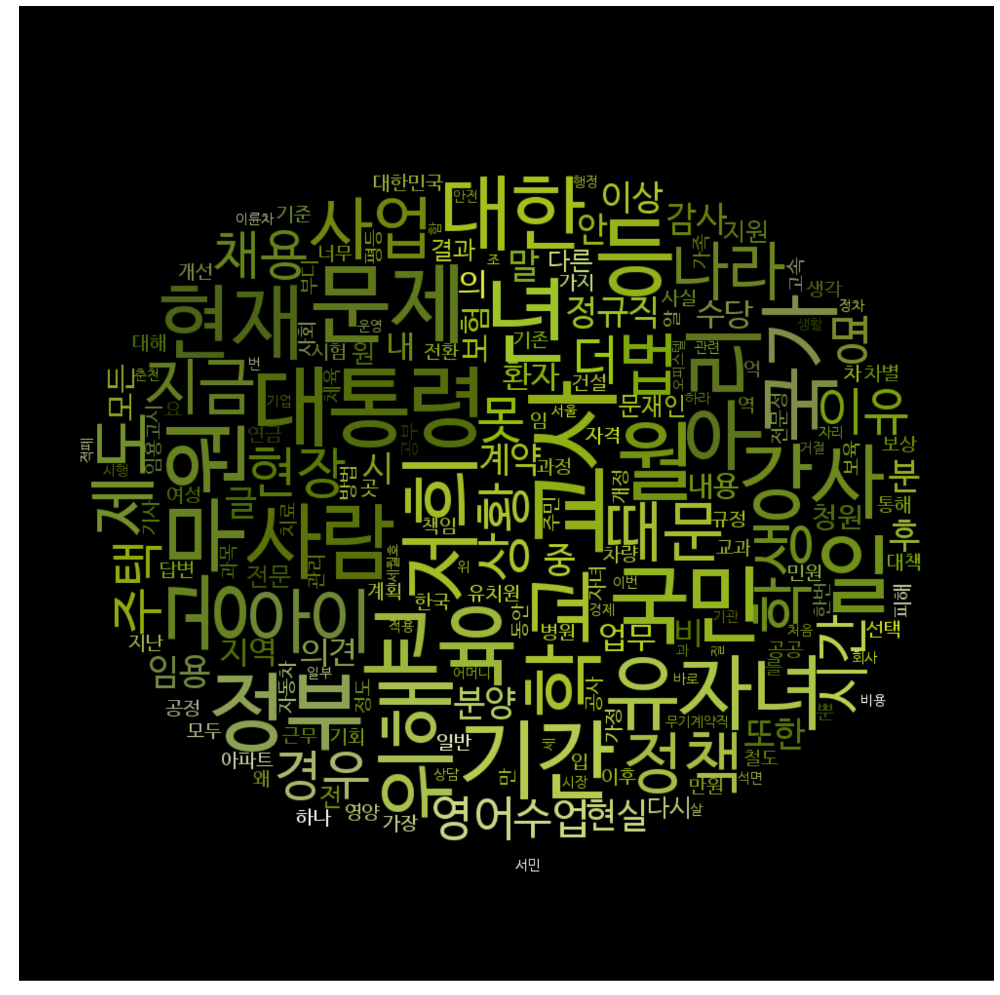

In [21]:
make_cloud("2017-08","8.jpg",max_font_size_n = 100,state="img",background_color_n='black')

466026
ok


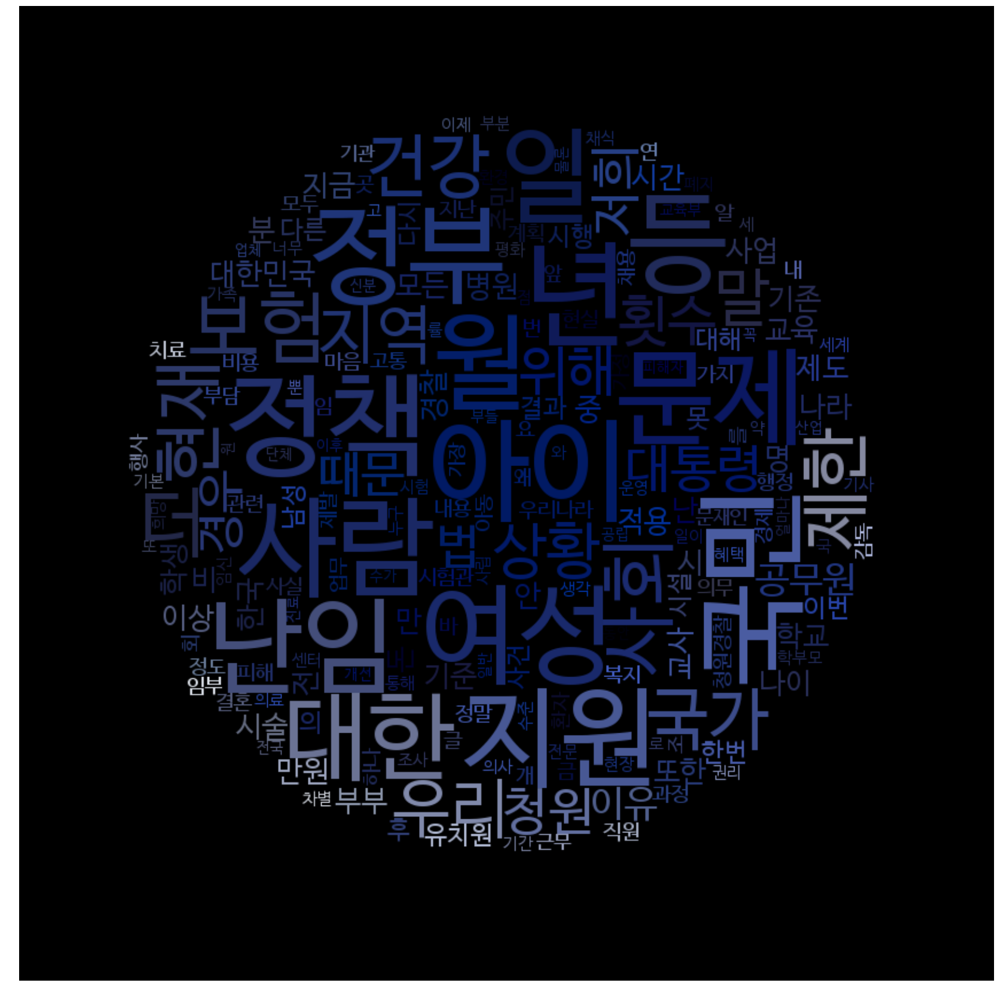

In [22]:
make_cloud("2017-09","9.jpg",max_font_size_n = 100,state="img",background_color_n='black')

248657
ok


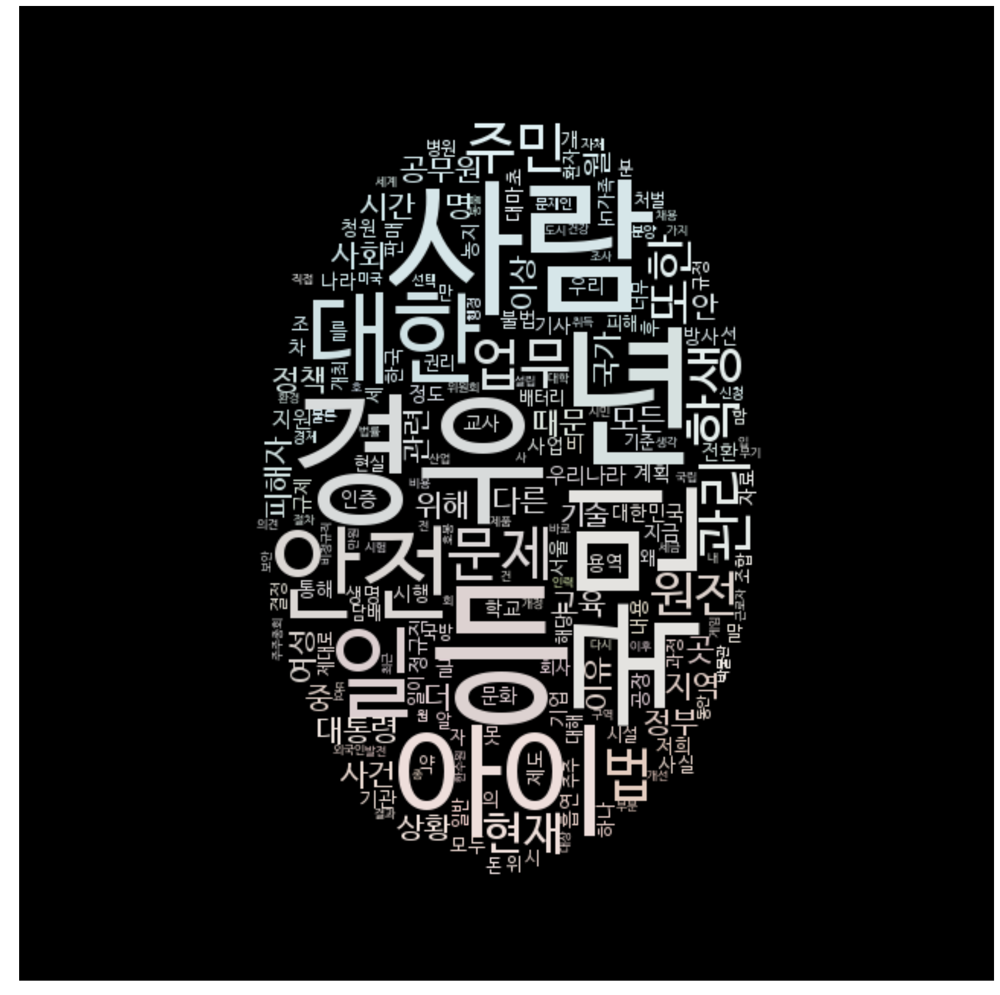

In [32]:
make_cloud("2017-10","10.jpg",max_font_size_n = 100,state="img",background_color_n='black')

472105
ok


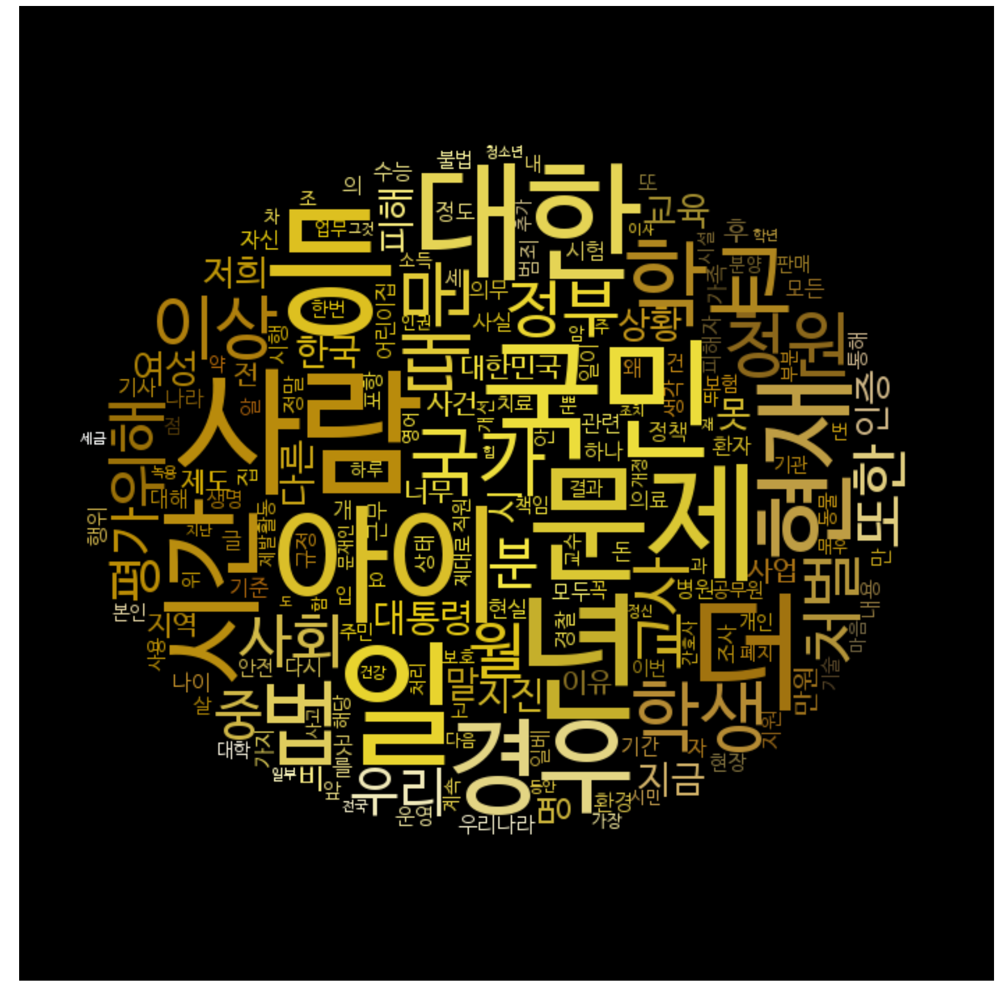

In [24]:
make_cloud("2017-11","11.png",max_font_size_n = 100,state="img",background_color_n='black')

729449
ok


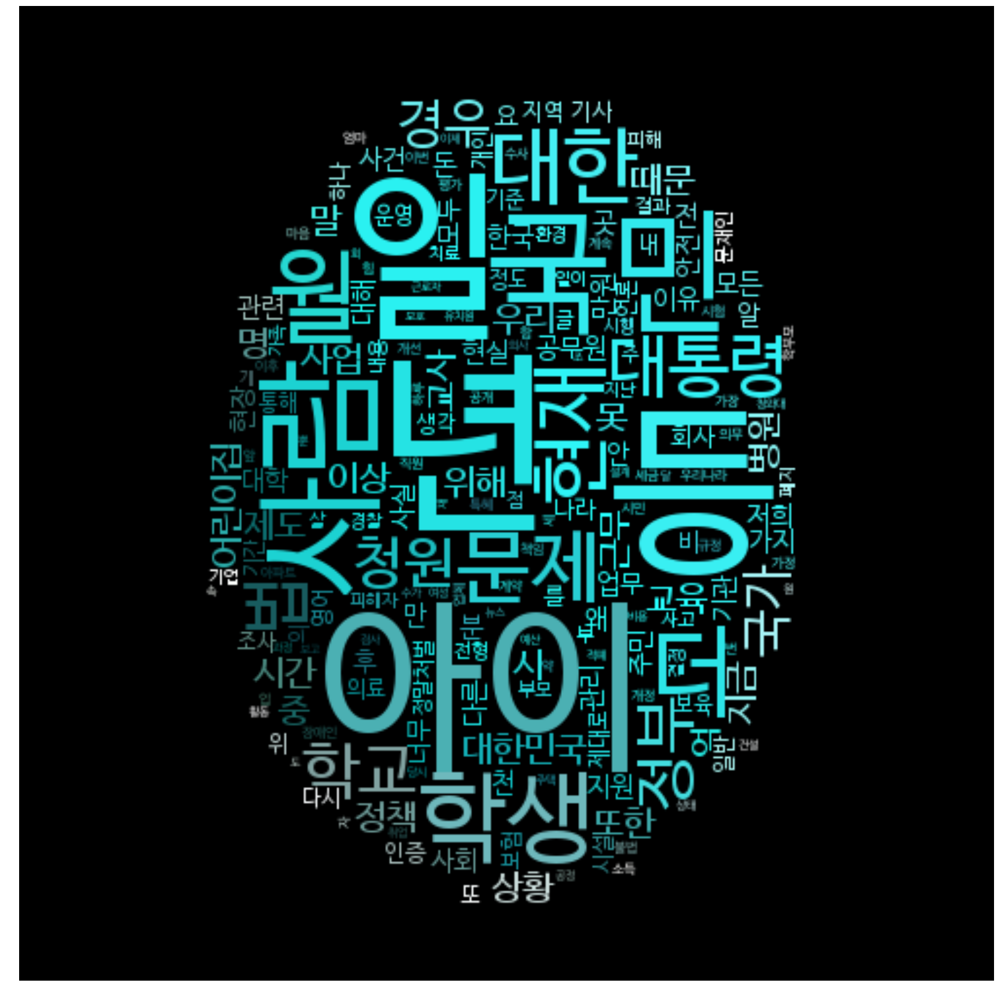

In [25]:
make_cloud("2017-12","12.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1143862
ok


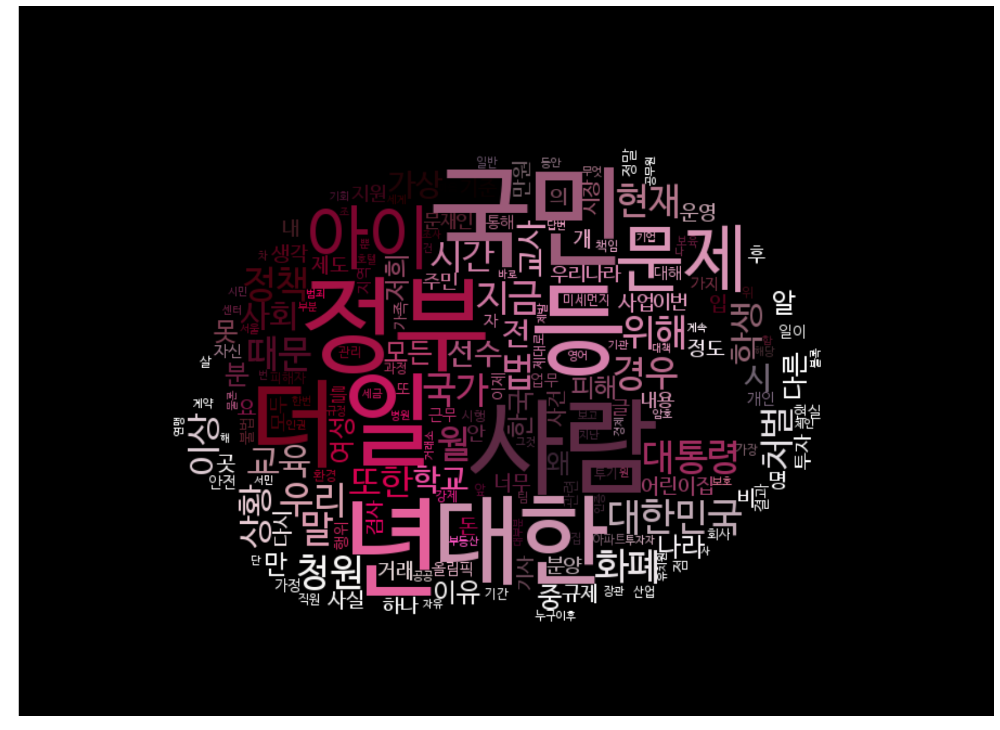

In [26]:
make_cloud("2018-01","1.jpg",max_font_size_n = 100,state="img",background_color_n='black')

904282
ok


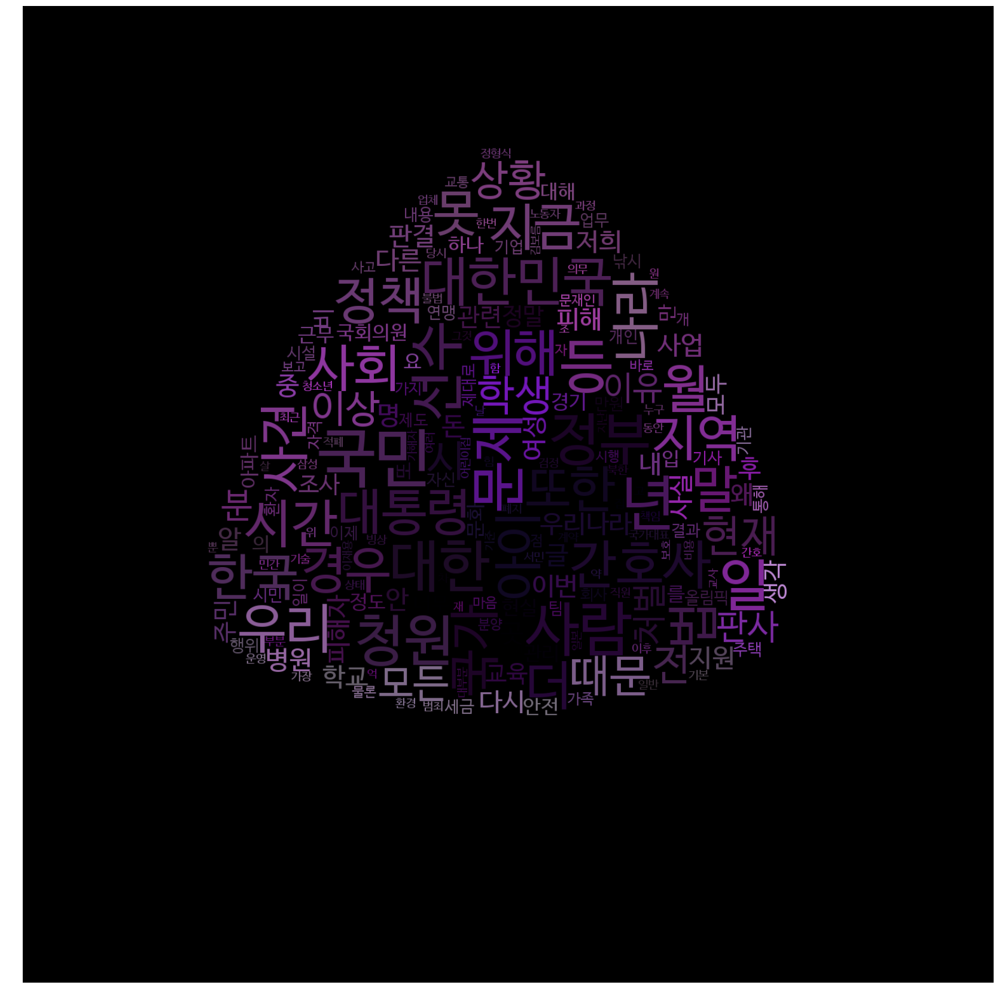

In [27]:
make_cloud("2018-02","2.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1139773
ok


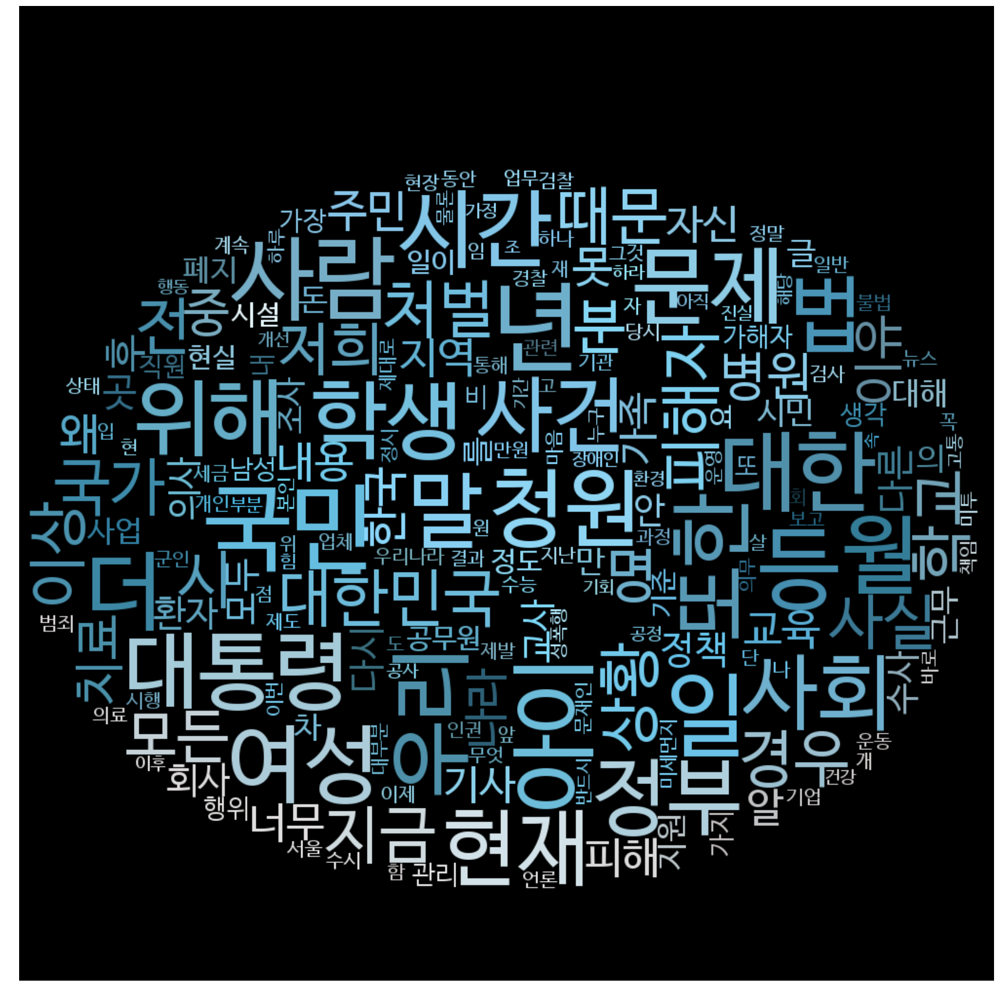

In [28]:
make_cloud("2018-03","3.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1503844
ok


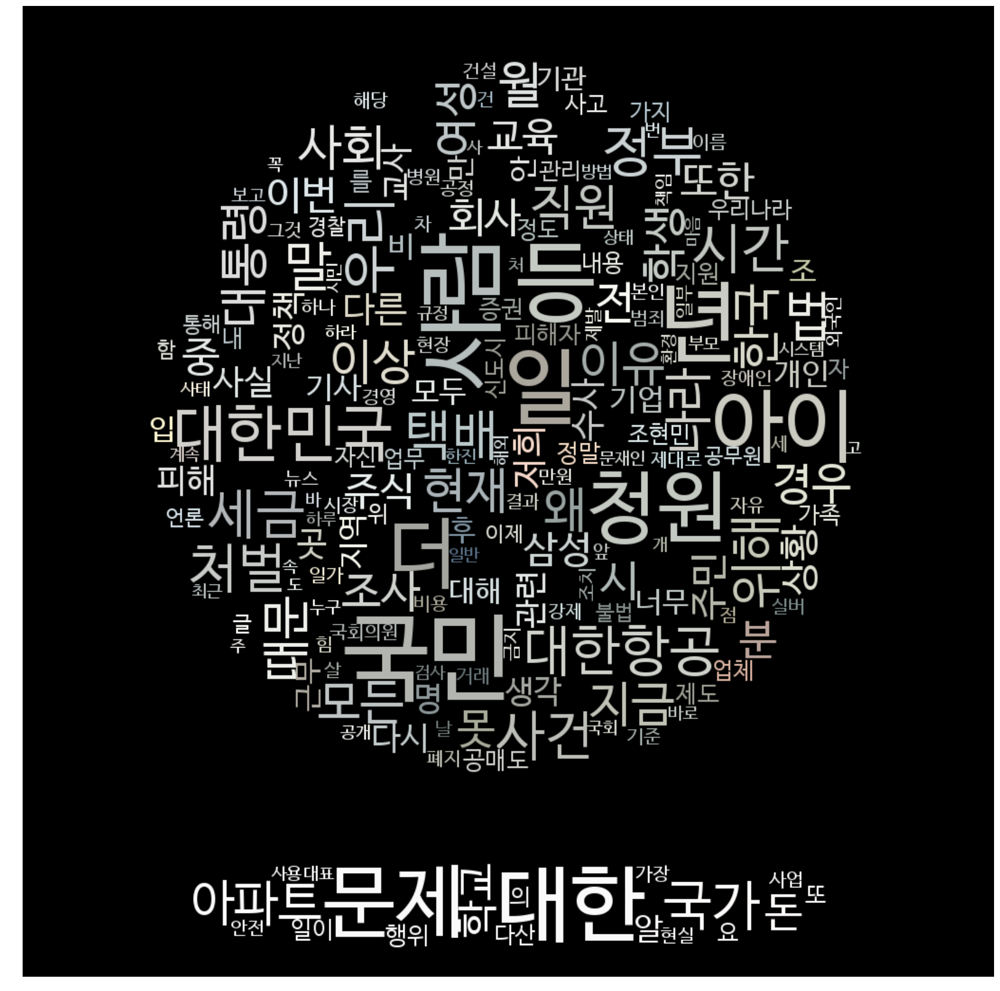

In [29]:
make_cloud("2018-04","4.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1606294
ok


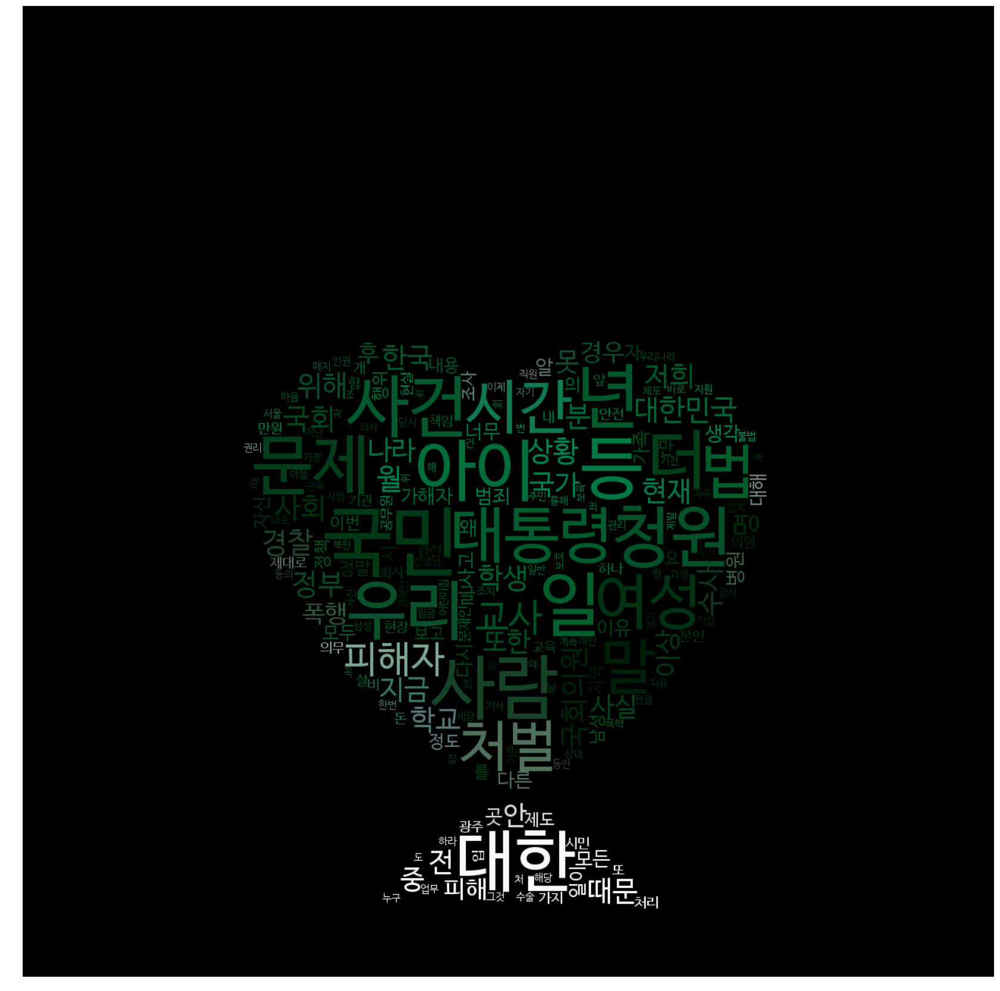

In [42]:
make_cloud("2018-05","5.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1547387
ok


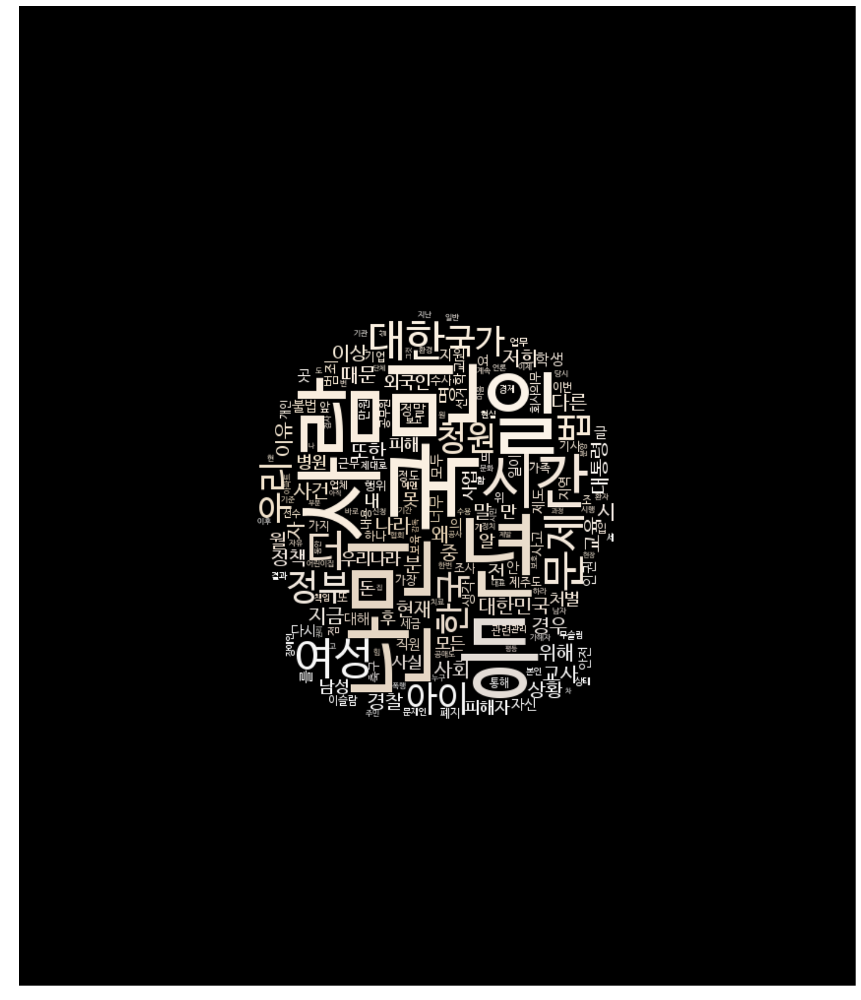

In [31]:
make_cloud("2018-06","6.JPG",max_font_size_n = 100,state="img",background_color_n='black')

1864590
ok


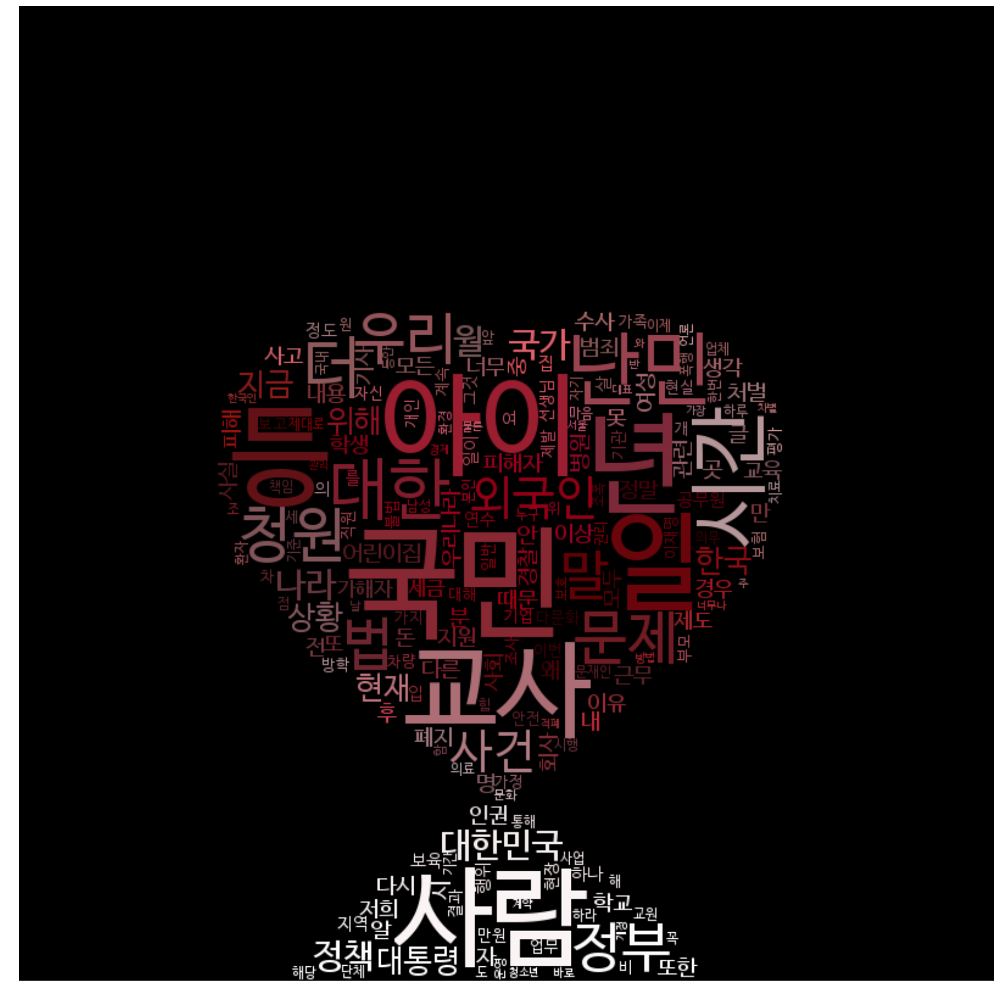

In [33]:
make_cloud("2018-07","7.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1117568
ok


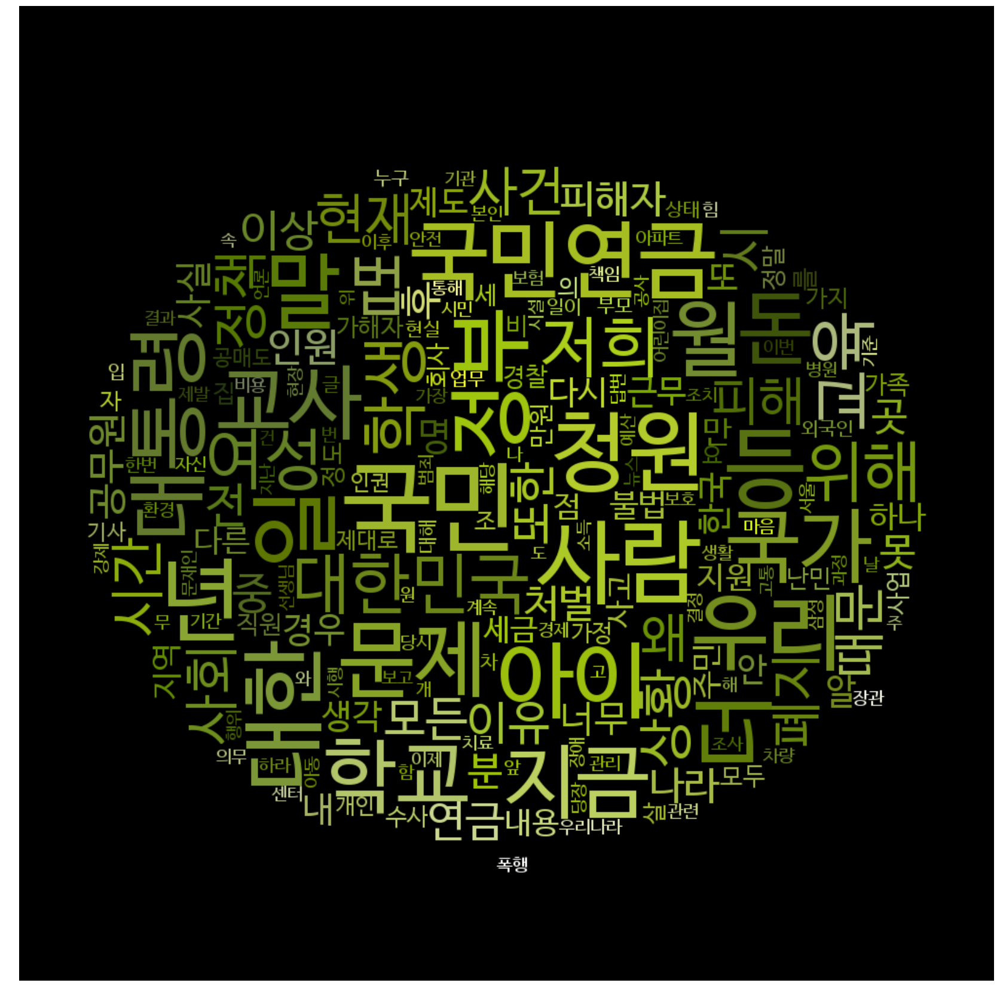

In [34]:
make_cloud("2018-08","8.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1250189
ok


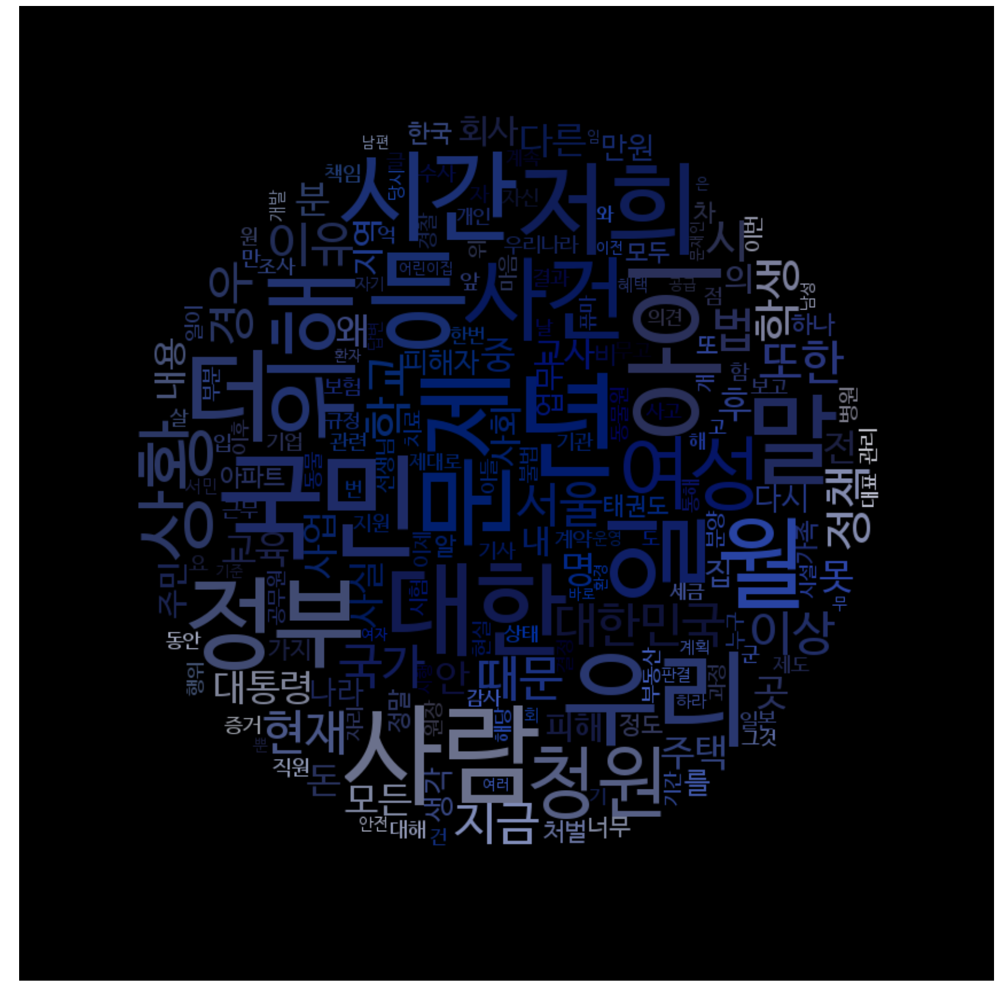

In [35]:
make_cloud("2018-09","9.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1697353
ok


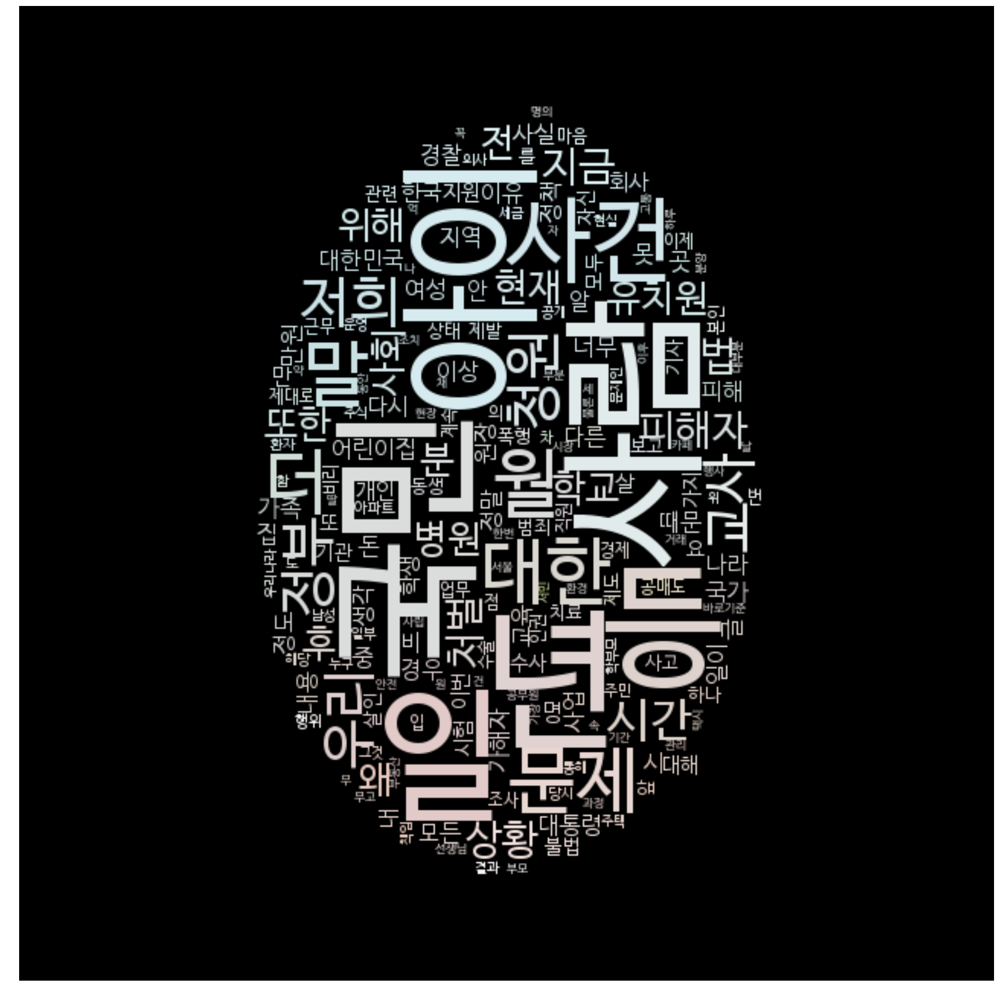

In [36]:
make_cloud("2018-10","10.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1571702
ok


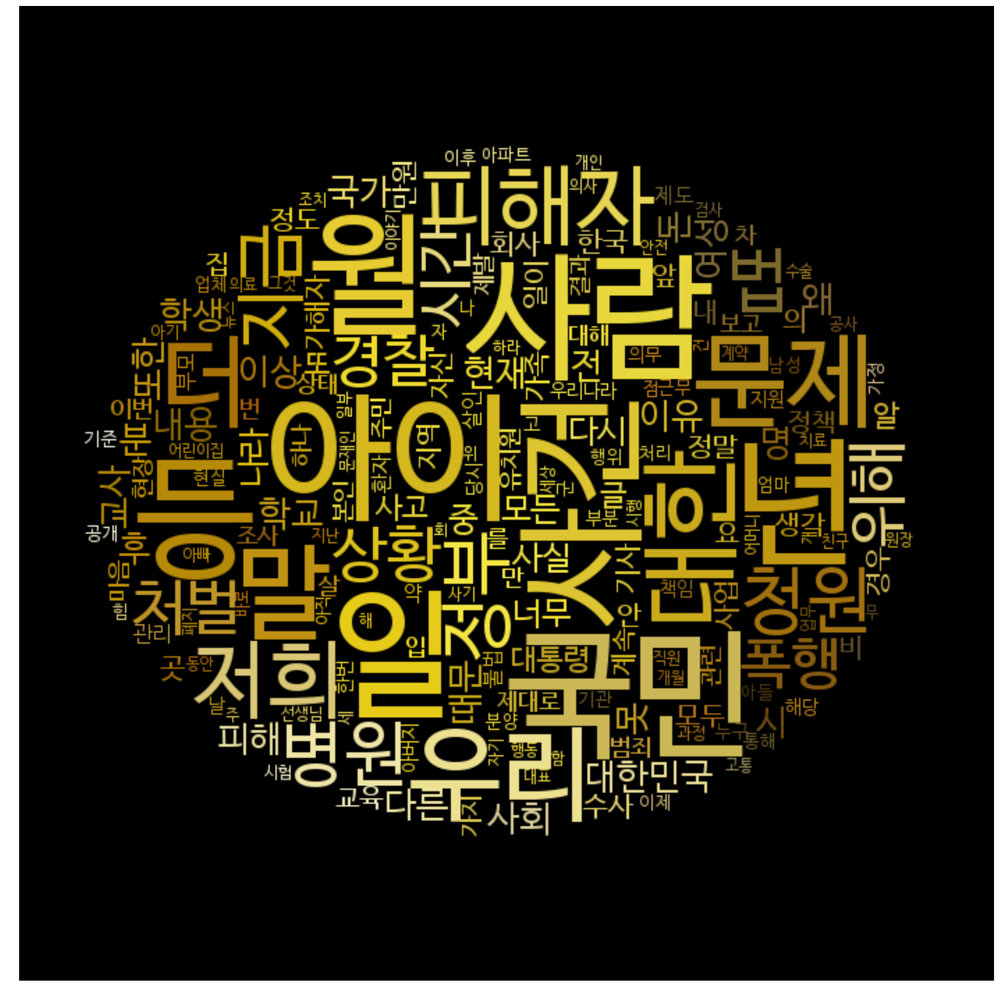

In [37]:
make_cloud("2018-11","11.png",max_font_size_n = 100,state="img",background_color_n='black')

982797
ok


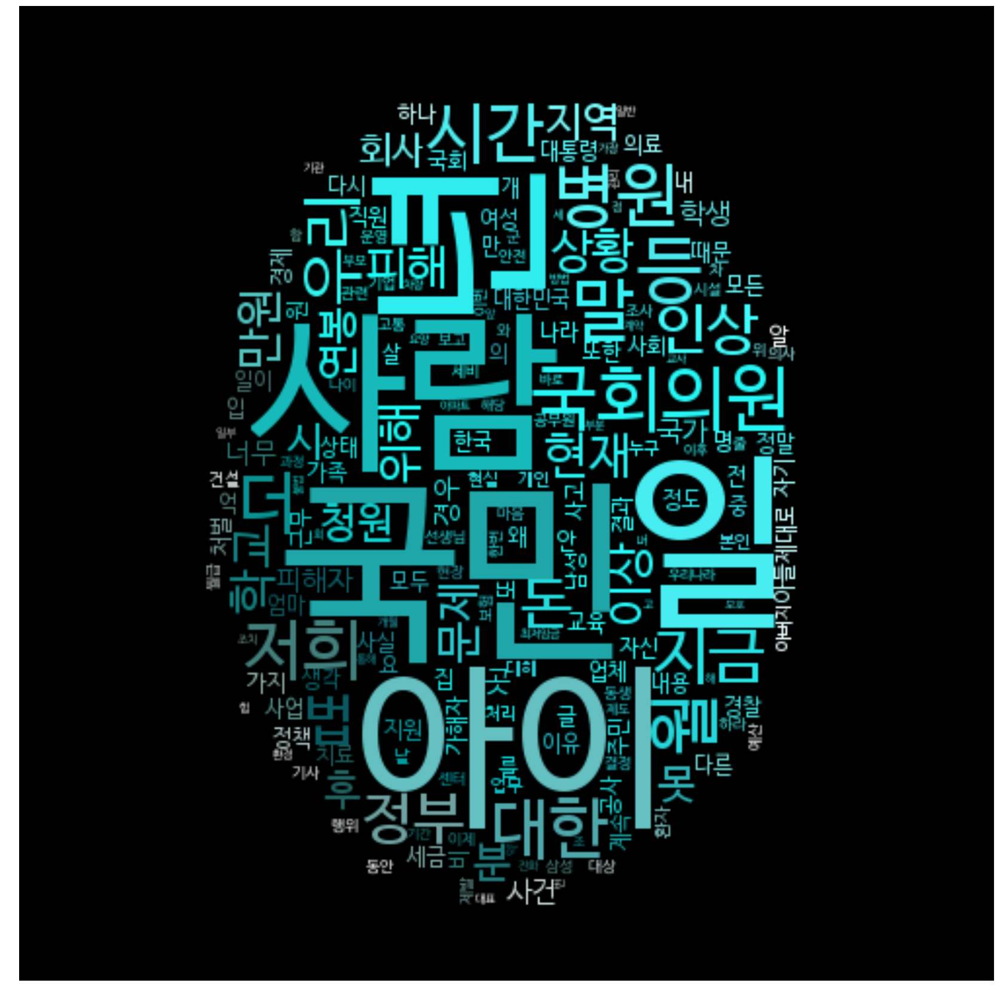

In [38]:
make_cloud("2018-12","12.jpg",max_font_size_n = 100,state="img",background_color_n='black')

1703
ok


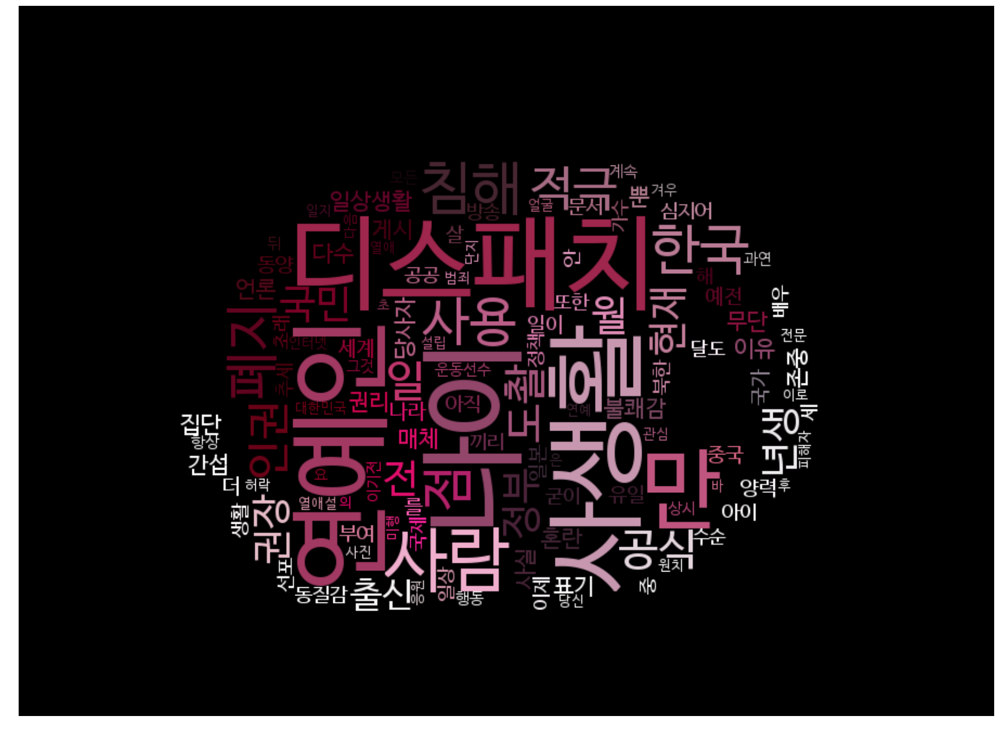

In [39]:
make_cloud("2019-01","1.jpg",max_font_size_n = 100,state="img",background_color_n='black')